In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

#1.Load Data

In [2]:
df = pd.read_csv('Fish.csv')
df

,Species,Weight,VerticalLen,DiagonalLen,CrossLen,Height,Width
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340
...,...,...,...,...,...,...,...
154,Smelt,12.2,11.5,12.2,13.4,2.0904,1.3936
155,Smelt,13.4,11.7,12.4,13.5,2.4300,1.2690
156,Smelt,12.2,12.1,13.0,13.8,2.2770,1.2558
157,Smelt,19.7,13.2,14.3,15.2,2.8728,2.0672


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Species      159 non-null    object 
 1   Weight       159 non-null    float64
 2   VerticalLen  159 non-null    float64
 3   DiagonalLen  159 non-null    float64
 4   CrossLen     159 non-null    float64
 5   Height       159 non-null    float64
 6   Width        159 non-null    float64
dtypes: float64(6), object(1)
memory usage: 8.8+ KB


In [4]:
df.corr()

C:\Users\nguye\AppData\Local\Temp\ipykernel_13812\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Weight,VerticalLen,DiagonalLen,CrossLen,Height,Width
Weight,1.000000,0.915712,0.918618,0.923044,0.724345,0.886507
VerticalLen,0.915712,1.000000,0.999517,0.992031,0.625378,0.867050
DiagonalLen,0.918618,0.999517,1.000000,0.994103,0.640441,0.873547
CrossLen,0.923044,0.992031,0.994103,1.000000,0.703409,0.878520
Height,0.724345,0.625378,0.640441,0.703409,1.000000,0.792881
Width,0.886507,0.867050,0.873547,0.878520,0.792881,1.000000


C:\Users\nguye\AppData\Local\Temp\ipykernel_13812\2306853626.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot =True)


Text(0.5, 1.0, 'Correlation Matrix')

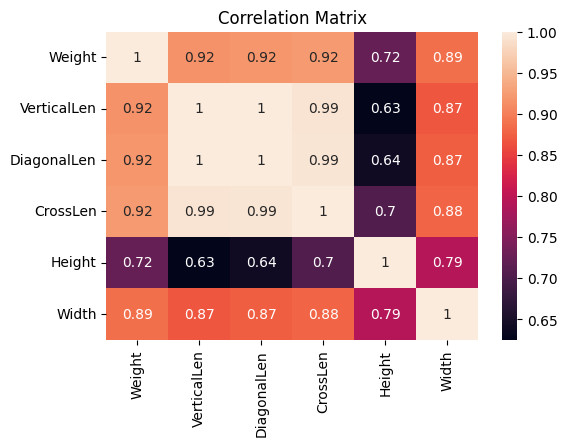

In [5]:
plt.rcParams["figure.figsize"] = (6,4)
sns.heatmap(df.corr(), annot =True)
plt.title('Correlation Matrix')

**One hot encoding**

In [6]:
encode_species = pd.get_dummies(df.Species)
encode_species.head(5)

,Bream,Parkki,Perch,Pike,Roach,Smelt,Whitefish
0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0


**Label Encoding**

In [7]:
df["Species"] = df["Species"].astype('category')
label_ecnoding_species = df["Species"].cat.codes
label_ecnoding_species

0      0
1      0
2      0
3      0
4      0
      ..
154    5
155    5
156    5
157    5
158    5
Length: 159, dtype: int8

In [8]:
new_df = pd.concat([df, encode_species], axis='columns')
new_df

,Species,Weight,VerticalLen,DiagonalLen,CrossLen,Height,Width,Bream,Parkki,Perch,Pike,Roach,Smelt,Whitefish
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200,1,0,0,0,0,0,0
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056,1,0,0,0,0,0,0
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961,1,0,0,0,0,0,0
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555,1,0,0,0,0,0,0
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,Smelt,12.2,11.5,12.2,13.4,2.0904,1.3936,0,0,0,0,0,1,0
155,Smelt,13.4,11.7,12.4,13.5,2.4300,1.2690,0,0,0,0,0,1,0
156,Smelt,12.2,12.1,13.0,13.8,2.2770,1.2558,0,0,0,0,0,1,0
157,Smelt,19.7,13.2,14.3,15.2,2.8728,2.0672,0,0,0,0,0,1,0


In [9]:
X = new_df[[
    'VerticalLen', 'DiagonalLen', 'CrossLen', 'Height', 'Width',
    'Bream', 'Parkki', 'Perch', 'Pike', 'Roach', 'Smelt', 'Whitefish'
]]
y = new_df['Weight']

In [10]:
X = X.values
y = y.values

In [11]:
X_data = np.hstack((np.ones((X.shape[0], 1)), X))
X_data

array([[ 1. , 23.2, 25.4, ...,  0. ,  0. ,  0. ],
       [ 1. , 24. , 26.3, ...,  0. ,  0. ,  0. ],
       [ 1. , 23.9, 26.5, ...,  0. ,  0. ,  0. ],
       ...,
       [ 1. , 12.1, 13. , ...,  0. ,  1. ,  0. ],
       [ 1. , 13.2, 14.3, ...,  0. ,  1. ,  0. ],
       [ 1. , 13.8, 15. , ...,  0. ,  1. ,  0. ]])

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_data, y, test_size=0.2, random_state=42)
print('X_train shape: ', X_train.shape)
print('X_test shape: ', X_test.shape)
print('y_train shape: ', y_train.shape)
print('y_train shape: ', y_test.shape)

X_train shape:  (127, 13)
X_test shape:  (32, 13)
y_train shape:  (127,)
y_train shape:  (32,)


#2.Linear Regression

In [13]:
def r2score(y_pred, y):
    rss = np.sum((y_pred - y) ** 2)
    tss = np.sum((y-y.mean()) ** 2)

    r2 = 1 - (rss / tss)
    return r2

In [14]:
class LinearRegression:
    def __init__(self, X_data, y_target, learning_rate=0.00001, num_epochs=10000):
        self.X_data = X_data
        self.y_target = y_target
        self.learning_rate = learning_rate
        self.num_epochs = num_epochs
        self.num_samples = self.X_data.shape[0]

        # Initial Coefficients
        self.theta = np.random.randn(self.X_data.shape[1])
        self.losses = []

    def compute_loss(self, y_pred, y_target):
        loss = (y_pred-y_target)*(y_pred-y_target)
        loss = np.mean(loss)
        return loss

    def predict(self, X_data):
        y_pred = X_data.dot(self.theta)
        return y_pred

    def fit(self):
        for epoch in range(self.num_epochs):
            # predict
            y_pred = self.predict(self.X_data)

            # compute loss
            loss = self.compute_loss(y_pred, self.y_target)
            self.losses.append(loss)

            # compute gradient
            k = 2*(y_pred-self.y_target)
            gradients = self.X_data.T.dot(k)/self.num_samples

            # update weight
            self.theta = self.theta - self.learning_rate*gradients

            print(f'Epoch: {epoch} - Loss: {loss}')

        return {
            'loss': sum(self.losses)/len(self.losses),
            'weight': self.theta
        }

In [15]:
linear_model = LinearRegression(X_train, y_train, learning_rate=0.00001, num_epochs=100000)
linear_model.fit()

Epoch: 0 - Loss: 348924.4078710328
Epoch: 1 - Loss: 314719.3012887077
Epoch: 2 - Loss: 284381.9927121907
Epoch: 3 - Loss: 257475.12143241992
Epoch: 4 - Loss: 233610.7823710822
Epoch: 5 - Loss: 212444.93376433433
Epoch: 6 - Loss: 193672.43721135185
Epoch: 7 - Loss: 177022.65858150533
Epoch: 8 - Loss: 162255.5663597069
Epoch: 9 - Loss: 149158.27118088855
Epoch: 10 - Loss: 137541.95666507407
Epoch: 11 - Loss: 127239.15730577434
Epoch: 12 - Loss: 118101.34416780241
Epoch: 13 - Loss: 109996.78358820765
Epoch: 14 - Loss: 102808.6380098324
Epoch: 15 - Loss: 96433.28156775533
Epoch: 16 - Loss: 90778.80614491244
Epoch: 17 - Loss: 85763.69635912904
Epoch: 18 - Loss: 81315.65437923027
Epoch: 19 - Loss: 77370.55762794147
Epoch: 20 - Loss: 73871.53434507902
Epoch: 21 - Loss: 70768.14368369276
Epoch: 22 - Loss: 68015.64851883966
Epoch: 23 - Loss: 65574.3704852826
Epoch: 24 - Loss: 63409.117945876766
Epoch: 25 - Loss: 61488.67864382856
Epoch: 26 - Loss: 59785.369724539996
Epoch: 27 - Loss: 58274.6386

{'loss': 36993.60407176011,
 'weight': array([-100.26156293,   34.77885129,   12.44503323,  -28.14525913,
          14.08471012,    7.48787202,   16.5933115 ,  -24.40925482,
         -31.53638874,    3.91481448,  -45.80868346,  -17.92867218,
           2.13718927])}

In [16]:
preds = linear_model.predict(X_train)
r2score(preds, y_train)

0.7580322796563324

In [17]:
preds = linear_model.predict(X_test)
r2score(preds, y_test)

0.7715222025883873

#3.Polynomial Regression

##3.1.Simple Approach
**Form**
$(a+b)^2 => a^2 + b^2 + a + b + 1$

In [18]:
def create_polynomial_features(X, degree=2):
    """Creates the polynomial features
    Args:
        X: A array for the data.
        degree: A intege for the degree of
        the generated polynomial function.
    """
    X_mem = []
    for X_sub in X.T:
        X_sub = X_sub.T
        X_new = X_sub
        for d in range(2, degree+1):
            X_new = np.c_[X_new, np.power(X_sub, d)]
        X_mem.extend(X_new.T)
    return np.c_[X_mem].T

In [19]:
X_poly = create_polynomial_features(X, degree=2)
X_poly

array([[ 23.2 , 538.24,  25.4 , ...,   0.  ,   0.  ,   0.  ],
       [ 24.  , 576.  ,  26.3 , ...,   0.  ,   0.  ,   0.  ],
       [ 23.9 , 571.21,  26.5 , ...,   0.  ,   0.  ,   0.  ],
       ...,
       [ 12.1 , 146.41,  13.  , ...,   1.  ,   0.  ,   0.  ],
       [ 13.2 , 174.24,  14.3 , ...,   1.  ,   0.  ,   0.  ],
       [ 13.8 , 190.44,  15.  , ...,   1.  ,   0.  ,   0.  ]])

In [20]:
X_poly.shape

(159, 24)

In [21]:
X_data = np.hstack((np.ones((X_poly.shape[0], 1)), X_poly))
X_data

array([[  1.  ,  23.2 , 538.24, ...,   0.  ,   0.  ,   0.  ],
       [  1.  ,  24.  , 576.  , ...,   0.  ,   0.  ,   0.  ],
       [  1.  ,  23.9 , 571.21, ...,   0.  ,   0.  ,   0.  ],
       ...,
       [  1.  ,  12.1 , 146.41, ...,   1.  ,   0.  ,   0.  ],
       [  1.  ,  13.2 , 174.24, ...,   1.  ,   0.  ,   0.  ],
       [  1.  ,  13.8 , 190.44, ...,   1.  ,   0.  ,   0.  ]])

In [22]:
X_data.shape, y.shape

((159, 25), (159,))

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X_data, y, test_size=0.2, random_state=42)
print('X_train shape: ', X_train.shape)
print('X_test shape: ', X_test.shape)
print('y_train shape: ', y_train.shape)
print('y_train shape: ', y_test.shape)

X_train shape:  (127, 25)
X_test shape:  (32, 25)
y_train shape:  (127,)
y_train shape:  (32,)


In [24]:
poly_model = LinearRegression(X_train, y_train, learning_rate=0.0000001, num_epochs=100000)
poly_model.fit()

Epoch: 0 - Loss: 2386110.5102620274
Epoch: 1 - Loss: 85847.19676445847
Epoch: 2 - Loss: 22614.632722608316
Epoch: 3 - Loss: 20835.610750424556
Epoch: 4 - Loss: 20744.955133243457
Epoch: 5 - Loss: 20700.858882261182
Epoch: 6 - Loss: 20658.219228302303
Epoch: 7 - Loss: 20615.79638895085
Epoch: 8 - Loss: 20573.555543061757
Epoch: 9 - Loss: 20531.494974217057
Epoch: 10 - Loss: 20489.61387869805
Epoch: 11 - Loss: 20447.911481125375
Epoch: 12 - Loss: 20406.387010150764
Epoch: 13 - Loss: 20365.039697775275
Epoch: 14 - Loss: 20323.868779316454
Epoch: 15 - Loss: 20282.87349339364
Epoch: 16 - Loss: 20242.053081913615
Epoch: 17 - Loss: 20201.40679005641
Epoch: 18 - Loss: 20160.933866261243
Epoch: 19 - Loss: 20120.63356221237
Epoch: 20 - Loss: 20080.505132825107
Epoch: 21 - Loss: 20040.547836231894
Epoch: 22 - Loss: 20000.760933768317
Epoch: 23 - Loss: 19961.143689959423
Epoch: 24 - Loss: 19921.695372505816
Epoch: 25 - Loss: 19882.415252270024
Epoch: 26 - Loss: 19843.30260326282
Epoch: 27 - Loss: 

{'loss': 5419.939751478688,
 'weight': array([-0.78880355, -1.22668238, -0.01807875, -3.92737656,  1.22590749,
        -3.3862625 , -0.67258976, -0.02716512,  1.96832397,  0.44384364,
         3.53605066,  0.63328677,  0.19384878,  0.0811969 , -0.01327797,
        -0.99061693, -0.10094231,  0.99916325, -0.99762312, -1.18690532,
        -0.82910636, -0.37563682, -0.04798262, -0.89597346, -1.5152868 ])}

In [25]:
preds = poly_model.predict(X_train)
r2score(preds, y_train)

0.9675746566763862

In [26]:
preds = poly_model.predict(X_test)
r2score(preds, y_test)

0.9718592170472626

##3.2.Advanced Approach
**Form**
$(a+b)^2 => a^2 + b^2 + ab + a + b + 1$

In [27]:
class PolynomialFeaturesForDegree():
    '''
    Calculates the polynomial features of a dataset for a given degree.

    Args:
        degree (int): The degree of the polynomial features to be calculated.

    Attributes:
        degree (int): The degree of the polynomial features to be calculated.
        options (list): A list containing n-tuples specifying the exponent of each
                        feature in the dataset for each term in the polynomial
                        expansion.
    '''

    def __init__(self, degree):
        self.degree = degree
        self.options = []


    def display_terms(self):
        '''
        If a training instance has three features, i.e. [a,b,c], and (0,0,2) is
        displayed this indicates that a^0 * b^0 * c^2 is a term in the polynomial
        expansion of the dataset.
        '''

        print('Exponents of features at each index:')
        for i in sorted(self.options):
            print(i)


    def get_terms(self, features):
        m = features.shape[1]

        # Determines the number of possible combinations with a summation of m
        # variables raised to power n.
        num = (self.degree+1)**m
        ls = [0] * m

        # Calculate all possible combinations of the features in the dataset.
        for x in range(1,num):
            for idx in range(len(ls)-1, -1, -1):
                if ls[idx] == 0:
                    ls[idx] += 1
                    break
                elif ls[idx] % self.degree == 0:
                    ls[idx] = 0
                    if ls[idx - 1] != self.degree:
                        ls[idx-1] += 1
                        break
                    else:
                        deficit = -1
                        stop = False
                        while not stop and (idx + deficit) > -1:
                            if ls[idx + deficit] != self.degree:
                                ls[idx + deficit] += 1
                                stop = True
                            else:
                                ls[idx + deficit] = 0
                                deficit -= 1
                        break
                elif idx == (len(ls) - 1):
                    ls[idx] += 1
                    break

            # This is the Kronecker Delta Function used to eliminate terms that
            # do not form part of the polynomial expansion.
            if sum(ls) == self.degree:
                self.options.append(tuple(ls))


    def get_polynomial_features(self, features):
        # Calculate the terms in the polynomial expansion.
        self.get_terms(features)

        poly_features  = np.empty((len(features),0))
        feature_ls = []

        # Add vector of ones for degree zero.
        for i in range(features.shape[1]):
            feature_ls.append(features[:,i].reshape(-1,1))

        # Add the polynomial features to the dataset.
        for i,tup in enumerate(self.options):
            vector = np.full((len(features), 1), 1)

            # Calculate polynomial feature.
            vector = np.float_(vector)
            for feature_idx, exp in enumerate(tup):
                vector *= feature_ls[feature_idx] ** exp

            # Append polynomial feature to the dataset.
            poly_features = np.c_[poly_features,vector]

        return poly_features



class PolynomialFeatures():
    '''
    Calculates the polynomial features for all degrees up to and including the
    specified degree.

    Args:
        degree (int): The highest degree polynomial features to be calculated.

    Attributes:
        degree (int): The highest degree polynomial features to be calculated.
        transformers (list): A list containing one transformer for each degree
                            for which polynomial features are to be calculated.
    '''

    def __init__(self, degree):
        self.degree = degree

    def fit(self):
        self.transformers = []
        # Add one transformer for each degree.
        for i in range(1, self.degree + 1):
            self.transformers.append(PolynomialFeaturesForDegree(i))

    def transform(self,dataset):
        try:
            temp = np.ones((len(dataset),1))
            # Calculate and add polynomial features for each degree to the dataset.
            for t in self.transformers:
                features_for_deg = t.get_polynomial_features(dataset)
                temp = np.c_[temp, features_for_deg]
            return temp
        except AttributeError:
            print('Transformer not fitted, call \'fit\' with appropriate arguments before using transformer.')

In [28]:
poly_feature = PolynomialFeatures(2)
poly_feature.fit()
X_data = poly_feature.transform(X)

In [29]:
# X_data has bias
X_data

array([[  1.  ,   0.  ,   0.  , ..., 696.  , 589.28, 538.24],
       [  1.  ,   0.  ,   0.  , ..., 748.8 , 631.2 , 576.  ],
       [  1.  ,   0.  ,   0.  , ..., 743.29, 633.35, 571.21],
       ...,
       [  1.  ,   0.  ,   1.  , ..., 166.98, 157.3 , 146.41],
       [  1.  ,   0.  ,   1.  , ..., 200.64, 188.76, 174.24],
       [  1.  ,   0.  ,   1.  , ..., 223.56, 207.  , 190.44]])

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X_data, y, test_size=0.2, random_state=42)
print('X_train shape: ', X_train.shape)
print('X_test shape: ', X_test.shape)
print('y_train shape: ', y_train.shape)
print('y_train shape: ', y_test.shape)

X_train shape:  (127, 91)
X_test shape:  (32, 91)
y_train shape:  (127,)
y_train shape:  (32,)


In [31]:
poly_model = LinearRegression(X_train, y_train, learning_rate=0.0000001, num_epochs=100000)
poly_model.fit()

Epoch: 0 - Loss: 41288986.994200654
Epoch: 1 - Loss: 21438464.37519663
Epoch: 2 - Loss: 11137178.504116328
Epoch: 3 - Loss: 5791349.440151404
Epoch: 4 - Loss: 3017093.800967154
Epoch: 5 - Loss: 1577325.7483530191
Epoch: 6 - Loss: 830075.3573846177
Epoch: 7 - Loss: 442200.4930105145
Epoch: 8 - Loss: 240821.25152285685
Epoch: 9 - Loss: 136223.7648708706
Epoch: 10 - Loss: 81852.11634899829
Epoch: 11 - Loss: 53546.65712936264
Epoch: 12 - Loss: 38769.99624923591
Epoch: 13 - Loss: 31015.9659431948
Epoch: 14 - Loss: 26908.22571324868
Epoch: 15 - Loss: 24694.62000791267
Epoch: 16 - Loss: 23465.844378174457
Epoch: 17 - Loss: 22749.982250418198
Epoch: 18 - Loss: 22302.09494725059
Epoch: 19 - Loss: 21995.032096159517
Epoch: 20 - Loss: 21762.769063879383
Epoch: 21 - Loss: 21571.002619221308
Epoch: 22 - Loss: 21401.89190534835
Epoch: 23 - Loss: 21246.13993994115
Epoch: 24 - Loss: 21098.884388922408
Epoch: 25 - Loss: 20957.56511447635
Epoch: 26 - Loss: 20820.817545304402
Epoch: 27 - Loss: 20687.8983

{'loss': 4586.046818278347,
 'weight': array([-0.42205257, -0.2255875 ,  1.51304992, -1.04165578,  0.10505385,
        -0.82338878,  0.88958668,  0.39942296,  0.17483449, -1.05670957,
        -3.85982703, -2.42987988, -2.85654519, -3.1911459 ,  0.53111303,
         2.83356611,  0.98201881, -0.45104064,  0.7808944 ,  0.57175072,
        -0.34556801, -1.84662806, -1.40604215,  0.04509084,  0.43259074,
         0.0189551 ,  0.15622153, -0.6168838 ,  0.09041025,  0.73716414,
         0.5054954 , -0.65290821, -0.95931563,  0.28826205, -0.13682498,
         0.74435708, -0.99311089, -1.03915391, -1.63615602, -0.36370529,
        -0.35540613,  0.24370837, -1.23626135, -0.77314627, -1.09461243,
        -0.23006246, -1.23066806, -0.27002942, -0.16861406, -0.45568073,
         1.11185325,  1.84039552, -1.53905671, -0.3229153 ,  0.50155406,
        -0.83715219,  1.88392136,  1.29475058,  0.43624216,  0.10355762,
         0.46367059, -1.3250138 , -1.01050557,  0.51170377,  0.94728001,
         1.35

In [32]:
preds = poly_model.predict(X_train)
r2score(preds, y_train)

0.9805244190366048

In [33]:
preds = poly_model.predict(X_test)
r2score(preds, y_test)

0.9794831424159541